<a href="https://colab.research.google.com/github/reshalfahsi/rocket-trajectory-optimization/blob/master/RocketTrajectoryOptimization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Rocket Trajectory Optimization Using REINFORCE Algorithm**

## **Important Libraries**

In [1]:
!pip install -q --no-cache-dir swig lightning
!pip install -q --no-cache-dir gymnasium[box2d]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 17.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 144.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.7/70.7 kB 140.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.8/65.8 kB 146.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 596.7/596.7 kB 24.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 83.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.8/69.8 kB 295.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 729.2/729.2 kB 27.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.5/59.5 kB 172.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 164.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 722.8/722.8 kB 29.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
import gymnasium as gym

import lightning as L
from lightning.pytorch import Trainer, seed_everything
from lightning.pytorch.loggers import TensorBoardLogger, CSVLogger
from lightning.pytorch.callbacks import ModelCheckpoint

import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import torch.nn.functional as F

from google.colab.patches import cv2_imshow

from collections import deque
import matplotlib.animation
from IPython.display import Image, HTML

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

import warnings

warnings.filterwarnings("ignore")

%matplotlib inline
plt.rcParams['axes.facecolor'] = 'lightgray'
plt.rcParams['mathtext.fontset'] = 'cm'
plt.rcParams['font.family'] = 'STIXGeneral'

## **Configuration**

In [3]:
ACTION_SPACE = [
    0, # do nothing
    1, # fire left orientation engine
    2, # fire main engine
    3, # fire right orientation engine
]

# x,y, vx, vy, theta, w, left_contact, right_contact
OBSERVATION_SPACE = 8

EPISODE = 6561
STEP = 1024
BATCH_SIZE = 1
LEARNING_RATE = 1e-3
GAMMA = 0.99
ENVIRONMENT_NAME = "LunarLander-v2"

## **Dataset**

In [4]:
class RLDataset(data.Dataset):
    def __init__(self, agent, env, eps=1e-8):
        self.agent = agent
        self.env = env
        self.eps = eps

    def __len__(self):
        return 1

    def __getitem__(self, idx):
        """
        On-policy method
        """
        obs, _ = self.env.reset()

        device = "cuda" if torch.cuda.is_available() else "cpu"

        reward = list()
        log_prob = list()
        discounted_rewards = list()

        for step in range(STEP):
            act_prob = self.agent(obs)
            act_prob = F.softmax(act_prob)
            action = self.agent.get_action(act_prob)
            log_prob.append(torch.log(act_prob.squeeze(0) + self.eps)[action])
            obs, r, terminated, truncated, idx = self.env.step(action)
            reward.append(r)

            done = terminated or truncated

            if done:
                break

        log_prob = torch.stack(log_prob)

        for T in range(len(reward)):
            Gt = 0
            pwr = 0
            for r in reward[T:]:
                Gt = Gt + GAMMA**pwr * r
                pwr = pwr + 1
            discounted_rewards.append(Gt)

        discounted_rewards = np.array(discounted_rewards)
        discounted_rewards = torch.tensor(
            discounted_rewards,
            dtype=torch.float32,
            device=device,
        )
        discounted_rewards = (discounted_rewards - torch.mean(discounted_rewards)) / (
            torch.std(discounted_rewards)
        )

        return discounted_rewards, log_prob, np.array(reward).sum()

## **Model**

In [5]:
class Rocket(nn.Module):
    def __init__(self):
        super().__init__()

        self.policy = nn.Sequential(
            nn.Linear(OBSERVATION_SPACE, 16),
            nn.Tanh(),
            nn.Linear(16, 64),
            nn.Tanh(),
            nn.Linear(64, 16),
            nn.Tanh(),
            nn.Linear(16, len(ACTION_SPACE)),
        )

    def forward(self, obs):
        device = 'cuda' if torch.cuda.is_available() else 'cpu'
        obs = torch.tensor(obs, dtype=torch.float32, device=device).unsqueeze(0)
        act_prob = self.policy(obs)
        return act_prob

    def get_action(self, p):
        return np.random.choice(
            ACTION_SPACE,
            p=p.squeeze(0).detach().cpu().numpy()
        )

In [6]:
AGENT = Rocket
AGENT_NAME = AGENT.__name__

In [7]:
class AgentWrapper(L.LightningModule):
    def __init__(
        self,
        agent,
        batch_size: int = BATCH_SIZE,
        lr: float = LEARNING_RATE,
        env: str = ENVIRONMENT_NAME,
    ):
        super().__init__()
        self.save_hyperparameters()

        self.agent = agent
        self.env = gym.make(self.hparams.env)
        self.automatic_optimization = False

        self.reward = list()

    def training_step(self, batch, nb_batch):
        discounted_reward, log_prob, reward = batch
        policy_gradient = -log_prob * discounted_reward
        opt = self.optimizers()
        opt.zero_grad()
        self.manual_backward(policy_gradient.mean())
        opt.step()

        self.log("reward", reward.data.cpu().numpy()[0], prog_bar=True)
        self.reward.append(reward.data.cpu().numpy()[0])

    def configure_optimizers(self):
        optimizer = optim.Adam(self.agent.parameters(), lr=self.hparams.lr)
        return optimizer

    def train_dataloader(self):
        dataset = RLDataset(self.agent, self.env)
        dataloader = data.DataLoader(
            dataset=dataset,
            batch_size=self.hparams.batch_size,
        )
        return dataloader

    def reward_curve(self):
        filename = f"/content/{AGENT_NAME}_reward_plot.png"
        plt.plot(self.reward, color="b")
        plt.title("Reward Curves")
        plt.xlabel("Episode")
        plt.ylabel("Reward")
        plt.grid()
        plt.savefig(filename)
        plt.clf()
        img = cv2.imread(filename)
        cv2_imshow(img)

## **Training**

In [8]:
CHECKPOINT_DIR = os.getcwd()
SEED = int(np.random.randint(2147483647))

print(f"Random seed: {SEED}")

Random seed: 1665761214


In [ ]:
%reload_ext tensorboard
%tensorboard --logdir=logs/lightning_logs/

In [10]:
seed_everything(SEED, workers=True)

agent = AGENT()
agent = AgentWrapper(agent)

tensorboardlogger = TensorBoardLogger(save_dir="logs/")
csvlogger = CSVLogger(save_dir="logs/")
checkpoint = ModelCheckpoint(
    monitor='reward',
    dirpath=CHECKPOINT_DIR,
    mode='max',
)

trainer = Trainer(
    accelerator="auto",
    devices=1,
    max_epochs=EPISODE,
    logger=[tensorboardlogger, csvlogger],
    callbacks=[checkpoint],
    log_every_n_steps=10,
)
trainer.fit(agent)

INFO: Global seed set to 1665761214
INFO:lightning.fabric.utilities.seed:Global seed set to 1665761214
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name  | Type   | Params
---------------------------------
0 | agent | Rocket | 2.3 K 
---------------------------------
2.3 K     Trainable params
0         Non-trainable params
2.3 K     Total params
0.009     Total estimated model params size (MB)
INFO:

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=6561` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=6561` reached.


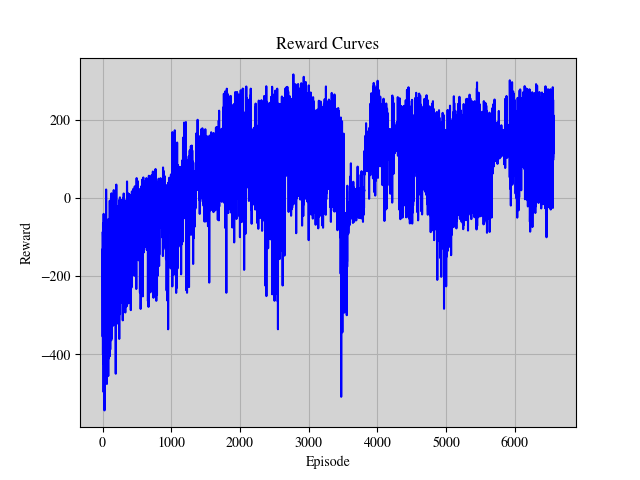

<Figure size 640x480 with 0 Axes>

In [11]:
trainer.strategy._lightning_module.reward_curve()

## **Inference**

In [12]:
INFERENCE_SEED = int(np.random.randint(2147483647))

print(f"Random seed: {INFERENCE_SEED}")


def animate_agent(env, agent, output, max_steps=STEP):
    obs, _ = env.reset(seed=INFERENCE_SEED)
    frames = deque()
    total_reward = 0
    frame = env.render()
    frame = cv2.putText(
        frame,
        f"Step: 0 Action : 0 Reward: 0 Total Rewards: {int(total_reward)} Done: False",
        (10, 20),
        cv2.FONT_HERSHEY_COMPLEX_SMALL,
        0.75,
        (255, 255, 255),
        1,
        cv2.LINE_AA,
    )
    frames.append(frame)
    for step in range(max_steps):
        act_prob = agent(obs)
        act_prob = F.softmax(act_prob)
        action = agent.get_action(act_prob)
        obs, reward, terminated, truncated, _ = env.step(action)
        total_reward += reward
        done = terminated or truncated
        frame = env.render()
        frame = cv2.putText(
            frame,
            f"Step: {step + 1} Action : {action} Reward: {int(reward)} Total Rewards: {int(total_reward)} Done: {done}",
            (10, 20),
            cv2.FONT_HERSHEY_COMPLEX_SMALL,
            0.75,
            (255, 255, 255),
            1,
            cv2.LINE_AA,
        )
        frames.append(frame)
        if done:
            break

    return animate_frames(frames, output)


def animate_frames(frames, output):
    new_height = 2.2
    original_height = frames[0].shape[0]
    original_width = frames[0].shape[1]
    new_width = (new_height / original_height) * original_width
    fig = plt.figure(figsize=(new_width, new_height), dpi=120)

    ax = plt.Axes(fig, [0.0, 0.0, 1.0, 1.0])
    ax.set_axis_off()
    fig.add_axes(ax)
    patch = ax.imshow(frames[0], aspect="auto", animated=True, interpolation="bilinear")
    animate = lambda i: patch.set_data(frames[i])

    ani = matplotlib.animation.FuncAnimation(
        fig, animate, frames=len(frames), interval=50
    )

    plt.close()
    if output == "html":
        return HTML(ani.to_jshtml())
    elif output == "gif":
        filename = f"/content/{AGENT_NAME}_inference.gif"
        ani.save(filename, writer="imagemagick", fps=60)
        with open(filename, "rb") as f:
            display(Image(data=f.read(), format="gif"))

Random seed: 16389786


In [13]:
__agent__ = AGENT()
__agent__ = AgentWrapper.load_from_checkpoint(checkpoint.best_model_path).agent

if torch.cuda.is_available():
    __agent__.cuda()
__agent__.eval()
__environment__ = gym.make(ENVIRONMENT_NAME, render_mode="rgb_array")

In [14]:
animate_agent(__environment__, __agent__, output="html")

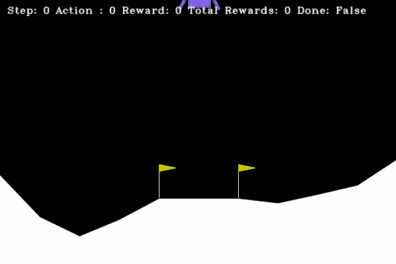

In [15]:
animate_agent(__environment__, __agent__, output="gif")